# This notebook shows short examples of the fly RL environment usage

#### To run this notebook, please follow these steps:
1. Download reference flight and walking data, and trained policies, at https://doi.org/10.25378/janelia.25309105
2. Unzip the downloaded files
3. Specify the paths to the data and policy files in the cell below

In [2]:
# Baseline pattern for wingbeat pattern generator.
wpg_pattern_path = 'path/to/your/wing_pattern_fmech.npy'
# Flight and walking reference data.
ref_flight_path = 'path/to/your/flight-dataset_saccade-evasion_augmented.hdf5'
ref_walking_path = 'path/to/your/walking-dataset_female-only_snippets-16252_trk-files-0-9.hdf5'

# Trained policies.
flight_policy_path = 'path/to/policy/for/flight'
walk_policy_path = 'path/to/policy/for/walking'

# Imports

In [4]:
import numpy as np
import PIL.ImageDraw

import tensorflow as tf
import tensorflow_probability as tfp
from acme import wrappers

from flybody.fly_envs import (
    flight_imitation,
    walk_imitation,
    vision_guided_flight,
)
from flybody.tasks.task_utils import (
    get_random_policy,
    real2canonical,
)
from flybody.agents.utils_tf import TestPolicyWrapper
from flybody.utils import (
    display_video,
    rollout_and_render,
)

In [5]:
# Frame width and height for rendering.
render_kwargs = {'width': 640, 'height': 480}

# 1. Flight environment test

Create flight environment and visualize the initial state

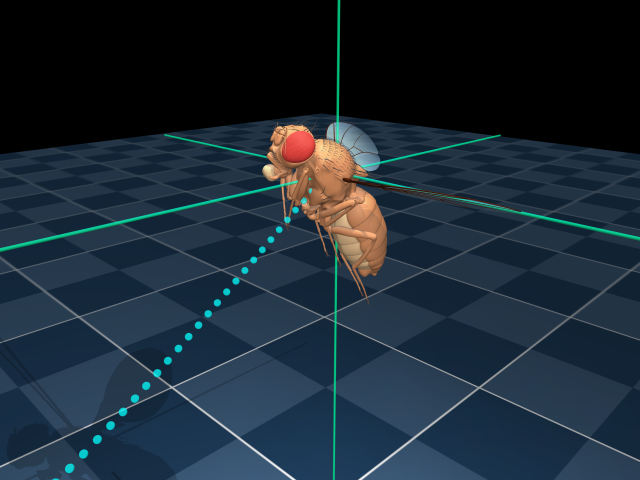

In [10]:
env = flight_imitation(wpg_pattern_path,
                       ref_flight_path,
                       terminal_com_dist=float('inf'))
env = wrappers.SinglePrecisionWrapper(env)
env = wrappers.CanonicalSpecWrapper(env, clip=True)

_ = env.reset()
pixels = env.physics.render(camera_id=1, **render_kwargs)
PIL.Image.fromarray(pixels)

Create dummy random-action policy, run episode, and make video. The gray "ghost" fly indicates the reference fly position

In [11]:
random_policy = get_random_policy(env.action_spec())

frames = rollout_and_render(env, random_policy, run_until_termination=True,
                            camera_ids=1, **render_kwargs)
display_video(frames)

Load trained policy, run episode, and make video

In [12]:
flight_policy = tf.saved_model.load(flight_policy_path)
# Wrap policy to work with non-batched observations at test time.
flight_policy = TestPolicyWrapper(flight_policy)

In [13]:
frames = rollout_and_render(env, flight_policy, run_until_termination=True,
                            camera_ids=1, **render_kwargs)
display_video(frames)

# 2. Walking environment test

Create flight environment and visualize the initial state

In [14]:
env = walk_imitation(ref_path=ref_walking_path,
                     terminal_com_dist=float('inf'))
env = wrappers.SinglePrecisionWrapper(env)
env = wrappers.CanonicalSpecWrapper(env, clip=True)

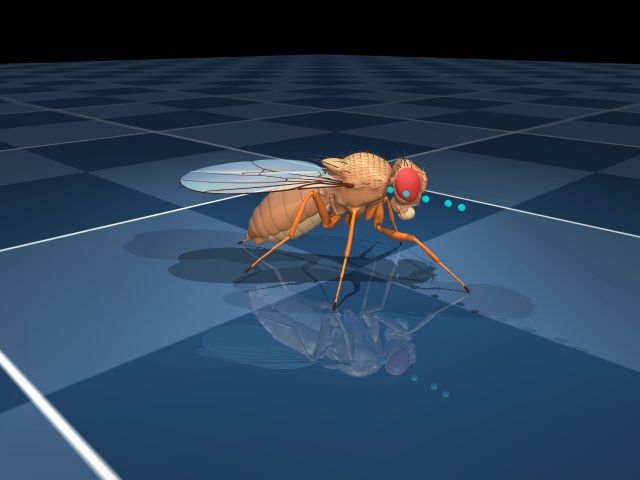

In [15]:
_ = env.reset()
pixels = env.physics.render(camera_id=1, **render_kwargs)
PIL.Image.fromarray(pixels)

Create dummy random-action policy, run episode, and make video. The gray "ghost" fly indicates the reference fly position

In [16]:
_random_policy = get_random_policy(env.action_spec(),
                                   minimum=-.5, maximum=.5)
def random_policy(observation):
    action = _random_policy(observation)
    # Transform random action centered around zero to canonical representation
    # to match CanonicalSpecWrapper we added to the walking environment above.
    action = real2canonical(action, env._environment.action_spec())
    return action

# Request a particular (sufficiently long) walking trajectory from dataset.
env.task.set_next_trajectory_index(idx=316)
frames = rollout_and_render(env, random_policy, run_until_termination=True,
                            camera_ids=2, **render_kwargs)
display_video(frames)

Load trained policy, run episode, and make video

In [19]:
walking_policy = tf.saved_model.load(walk_policy_path)
walking_policy = TestPolicyWrapper(walking_policy)

In [20]:
# Request a particular (sufficiently long) walking trajectory from dataset.
env.task.set_next_trajectory_index(idx=316)
frames = rollout_and_render(env, walking_policy, run_until_termination=True,
                            camera_ids=2, **render_kwargs)
display_video(frames)